# Song Vocal Extraction

## Imports

In [96]:
import os
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio
import stempeg
from sklearn.model_selection import train_test_split
import soundfile as sf

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

## Grabbing Data

In [62]:
path = "./data/"
song_names = os.listdir(path)
print(len(song_names))

150


## Understanding Data Format

In [102]:
def getSongStems(path, new_sr):
    x, sr = stempeg.read_stems(path, stem_id=[0, 4])
    x = (x[:, :, 0] + x[:, :, 1]) / 2.0
    x = librosa.resample(x, orig_sr=sr, target_sr=new_sr)
    return x, new_sr

In [105]:
file_path = path + song_names[1]
x, sr = getSongStems(file_path, 11025)

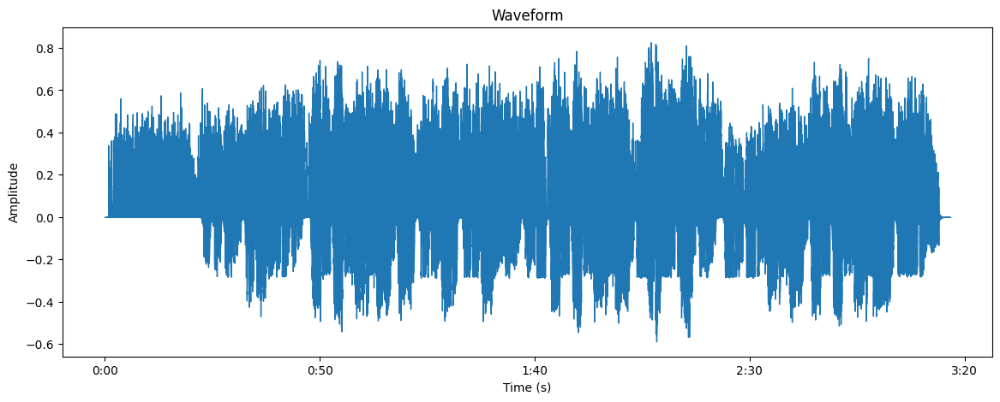

In [106]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

### Playing Full Song

In [66]:
Audio(x[0], rate=sr)

### Playing Isolated Audio

In [67]:
Audio(x[1], rate=sr)

## Data Preparation

### Split Data Into 10 Second Clips

In [73]:
def get_clips(song_name, path, output_dir, new_sr = 11025, segment_duration = 10):
    x, sr = getSongStems(path + song_name, new_sr)
    num_segments = int(len(x[0]) / (segment_duration * sr))
    
    if not os.path.exists(output_dir + "mixtures/"):
        os.makedirs(output_dir + "mixtures/")

    if not os.path.exists(output_dir + "vocals/"):
        os.makedirs(output_dir + "vocals/")
        
    for i in range(num_segments):
        start_sample = i * segment_duration * sr
        end_sample = (i + 1) * segment_duration * sr
        mixture_segment = x[0, start_sample:end_sample]
        vocal_segment = x[1, start_sample:end_sample]
        mixture_output_path = os.path.join(output_dir + "mixtures/", f"{song_name}_segment_{i}.wav")
        vocal_output_path = os.path.join(output_dir + "vocals/", f"{song_name}_segment_{i}.wav")
        sf.write(mixture_output_path, mixture_segment, sr)
        sf.write(vocal_output_path, vocal_segment, sr)

#### Train Test Split Before Creating 10 Second Segments

In [74]:
train_songs, test_songs = train_test_split(song_names, test_size=0.2, random_state=42)

train_output_dir = "./segmented_data/train/"
for song in train_songs:
    get_clips(song, path, train_output_dir)

test_output_dir = "./segmented_data/test/"
for song in test_songs:
    get_clips(song, path, test_output_dir)

### Generate Spectrograms for each Song Segment

In [87]:
def getSpectrograms(path, song_names, new_sr = 11025):
    res = []
    for song_name in song_names:
        x, sr = librosa.load(path + song_name, sr = new_sr)
        X = abs(librosa.stft(x))
        X = librosa.amplitude_to_db(X)
        res.append(X)

    return torch.tensor(res)

In [88]:
train_mixture_names = os.listdir("./segmented_data/train/mixtures/")
train_vocal_names = os.listdir("./segmented_data/train/vocals/")
test_mixture_names = os.listdir("./segmented_data/test/mixtures/")
test_vocal_names = os.listdir("./segmented_data/test/vocals/")

train_mixture_spec = getSpectrograms("./segmented_data/train/mixtures/", train_mixture_names)
train_vocal_spec = getSpectrograms("./segmented_data/train/vocals/", train_vocal_names)
test_mixture_spec = getSpectrograms("./segmented_data/test/mixtures/", test_mixture_names)
test_vocal_spec = getSpectrograms("./segmented_data/test/vocals/", test_vocal_names)

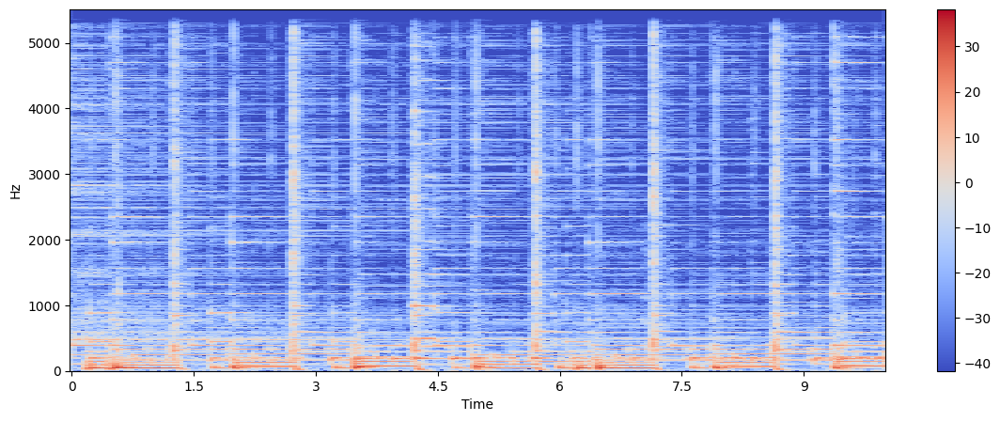

In [89]:
plt.figure(figsize = (14, 5))
librosa.display.specshow(train_mixture_spec[150].numpy(), sr = 11025, x_axis = "time", y_axis = "hz")
plt.colorbar()

### Creating PyTorch Dataset

In [108]:
class SongDataset(Dataset):
    def __init__(self, mixture, vocals):
        self.mixture = mixture
        self.vocals = vocals

    def __len__(self):
        return len(self.mixture)

    def __getitem__(self, idx):
        return self.mixture[idx, :, :], self.vocals[idx, :, :]

In [109]:
train_dataset = SongDataset(train_mixture_spec, train_vocal_spec)
test_dataset = SongDataset(test_mixture_spec, test_vocal_spec)

### Creating PyTorch DataLoaders

In [110]:
train_dl = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dl = DataLoader(test_dataset, batch_size=32, shuffle=True)

## Defining Basic U-NET

In [111]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 3):
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, padding=kernel_size // 2),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, padding=kernel_size // 2),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)

class ConvEncoder(ConvBlock):
    def __init__(self, in_channels, kernel_size = 3):
        super(ConvEncoder, self).__init__(in_channels, in_channels * 2, kernel_size)

class ConvDecoder(ConvBlock):
    def __init__(self, in_channels, kernel_size = 3):
        super(ConvEncoder, self).__init__(in_channels, in_channels // 2, kernel_size)

class Upsampler(nn.Module):
    def __init__(self, in_channel):
        nn.ConvTranspose2d(in_channel, in_channel // 2, kernel_size=2, stride=2)

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()    

        # Encoders
        self.encoder1 = ConvBlock(1, 16)
        self.encoder2 = ConvEncoder(16)
        self.encoder3 = ConvEncoder(32)
        self.encoder4 = ConvEncoder(64)
        self.encoder5 = ConvEncoder(128)
        
        # Bottleneck
        self.bottleneck = ConvEncoder(256)
        
        # Transpose Convolutions
        self.up6 = Upsampler(512)
        self.up5 = Upsampler(256)
        self.up4 = Upsampler(128)
        self.up3 = Upsampler(64)
        self.up2 = Upsampler(32)

        # Decoders
        self.decoder5 = ConvDecoder(512)
        self.decoder4 = ConvDecoder(256)
        self.decoder3 = ConvDecoder(128)
        self.decoder2 = ConvDecoder(64)
        self.decoder1 = ConvDecoder(32)
        
        self.mask = nn.Conv2d(16, 1, kernel_size=1)
        
    def forward(self, x):
        og_x = x
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(nn.MaxPool2d(2)(enc1))
        enc3 = self.encoder3(nn.MaxPool2d(2)(enc2))
        enc4 = self.encoder4(nn.MaxPool2d(2)(enc3))
        enc5 = self.encoder5(nn.MaxPool2d(2)(enc4))
        
        # Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc5))
        
        # Decoder
        dec_in_5 = torch.cat((enc5, self.up6(bottleneck)), dim=2)
        dec5 = self.decoder5(dec_in_5)
        dec_in_4 = torch.cat((enc4, self.up5(dec5)), dim=2)
        dec4 = self.decoder4(dec_in_4)
        dec_in_3 = torch.cat((enc3, self.up4(dec4)), dim=2)
        dec3 = self.decoder3(dec_in_3)
        dec_in_2 = torch.cat((enc2, self.up3(dec3)), dim=2)
        dec2 = self.decoder2(dec_in_2)
        dec_in_1 = torch.cat((enc1, self.up2(dec2)), dim=2)
        dec1 = self.decoder2(dec_in_1)
        
        # Output
        mask = self.mask(dec1)
        return mask * og_x